### This post summarize the result of TFT model for adjusted return prediction

In [ ]:
import os
import sys
import copy

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
from pathlib import Path

from datetime import timedelta, datetime

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates


from statsmodels.distributions.copula.api import GaussianCopula

from scipy.stats import norm, rankdata
from scipy.stats import wasserstein_distance
from scipy.spatial.distance import euclidean, jensenshannon, cosine
from scipy.spatial import distance_matrix
from fastdtw import fastdtw

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [ ]:
from google.colab import drive

# Try unmounting first if it's already mounted
try:
  drive.flush_and_unmount()
  print('Drive unmounted')
except ValueError:
  pass

drive.mount('/content/drive',force_remount=True)

base_path = '/content/drive/My Drive/Able_DahamKim/'
data_path = '/content/drive/My Drive/Able_DahamKim/data/'
input_path = '/content/drive/My Drive/Able_DahamKim/data/input/'
output_path = '/content/drive/My Drive/Able_DahamKim/data/output-return-3y-complex-low-learn-v2/'

print("original directory is : ", os.getcwd())
os.chdir(base_path)
print("directory changed to : ", os.getcwd())

plot_path = output_path + "plots/"
numeric_path = output_path + "numeric/"
interprete_path = output_path + "interprete/"

os.chdir(base_path)
print("directory changed to : ", os.getcwd())

Drive unmounted
Mounted at /content/drive
original directory is :  /content
directory changed to :  /content/drive/My Drive/Able_DahamKim
directory changed to :  /content/drive/My Drive/Able_DahamKim


In [ ]:
from plot_simulation import plot_returns

In [ ]:
# start_date = "2014-06-30"
# end_date = "2024-06-30"

_start_date = "2016-07-01"
_end_date = "2024-07-01"

tickers = ["AAPL", "MSFT", "JNJ", "UNH", "KO", "HD", "UNP", "BA", "PG", "WMT", "XOM", "CVX", "AEP", "DUK", "AMT", "SPG"]


In [ ]:
def build_start_end_date(start_date, end_date, encoder_length, predict_length):
    # Generate the monthly date range from start to end date
    date_range = pd.date_range(start=start_date, end=end_date, freq='MS')

    # Create DataFrame with first and last days of each month
    date_info = pd.DataFrame({
        "train_start": date_range - pd.Timedelta(days=encoder_length),
        "train_end": date_range,
        "predict_start": date_range + pd.Timedelta(days=1),
        "predict_end": date_range + pd.Timedelta(days=predict_length)
    })

    # for pred_start in date_info['predict_start']:
    #   temp_dir = numeric_path + pred_start.strftime("%Y-%m-%d") + "/"
    #   os.makedirs(temp_dir, exist_ok=True)

    #   temp_dir = plot_path + pred_start.strftime("%Y-%m-%d") + "/"
    #   os.makedirs(temp_dir, exist_ok=True)

    #   temp_dir = interprete_path + pred_start.strftime("%Y-%m-%d") + "/"
    #   os.makedirs(temp_dir, exist_ok=True)

    return date_info

# Use the function
time_bounds = build_start_end_date(_start_date, _end_date, encoder_length=365*3, predict_length=30 )
time_bounds

,train_start,train_end,predict_start,predict_end
0,2013-07-02,2016-07-01,2016-07-02,2016-07-31
1,2013-08-02,2016-08-01,2016-08-02,2016-08-31
2,2013-09-02,2016-09-01,2016-09-02,2016-10-01
3,2013-10-02,2016-10-01,2016-10-02,2016-10-31
4,2013-11-02,2016-11-01,2016-11-02,2016-12-01
...,...,...,...,...
92,2021-03-02,2024-03-01,2024-03-02,2024-03-31
93,2021-04-02,2024-04-01,2024-04-02,2024-05-01
94,2021-05-02,2024-05-01,2024-05-02,2024-05-31
95,2021-06-02,2024-06-01,2024-06-02,2024-07-01


In [ ]:
def get_annual_cum_return(start_idx, end_idx):
  _df_validation = pd.DataFrame()

  for i in range(start_idx, end_idx):
    train_start = time_bounds.iloc[i]['train_start']
    train_end = time_bounds.iloc[i]['train_end']
    predict_start = time_bounds.iloc[i]['predict_start']
    predict_end = time_bounds.iloc[i]['predict_end']

    print(i+1,"/",len(time_bounds), train_start, train_end, predict_end)

    _df_valid = pd.read_csv(numeric_path + time_bounds.iloc[i]['predict_start'].strftime("%Y-%m-%d") + "/" + "df_validation.csv", index_col=0)
    _df_valid['Date'] = pd.to_datetime(_df_valid['Date'])

    _df_validation = pd.concat([_df_validation, _df_valid])
    _df_validation.reset_index(drop=True, inplace=True)

  # # Compute log returns
  # log_returns = np.log(1 + _df_validation.loc[:, _df_validation.columns != 'Date'])
  # # Compute cu  mulative log returns
  # _df_validation_cum = log_returns.cumsum()
  # # Add the time column back
  # _df_validation_cum['Date'] = _df_validation['Date']

  _returns = 1 + _df_validation.loc[:, _df_validation.columns != 'Date']
  _df_validation_cum = _returns.cumprod()
  _df_validation_cum['Date'] = _df_validation['Date']

  return _df_validation, _df_validation_cum

# df_validation_cum = get_annual_cum_return(start_idx=0, end_idx=6) # 2016
# df_validation_cum = get_annual_cum_return(start_idx=6, end_idx=18) # 2017
# df_validation_cum = get_annual_cum_return(start_idx=18, end_idx=30) # 2018
# df_validation_cum = get_annual_cum_return(start_idx=30, end_idx=42) # 2019
# df_validation_cum = get_annual_cum_return(start_idx=42, end_idx=54) # 2020
# df_validation_cum = get_annual_cum_return(start_idx=54, end_idx=66) # 2021
# df_validation_cum = get_annual_cum_return(start_idx=66, end_idx=78) # 2022
# df_validation_cum = get_annual_cum_return(start_idx=78, end_idx=90) # 2023
# df_validation_cum = get_annual_cum_return(start_idx=90, end_idx=96) # 2024

In [ ]:
# Function to calculate Value at Risk (VaR)
def calculate_var(returns, confidence_level=0.95):
    # Calculate the VaR at the specified confidence level
    return returns.quantile(1 - confidence_level)

# Function to calculate Conditional Value at Risk (CVaR)
def calculate_cvar(returns, confidence_level=0.95):
    # Calculate VaR
    var = calculate_var(returns, confidence_level)
    # Calculate CVaR as the mean of the returns worse than VaR
    return returns[returns <= var].mean()

# Function to calculate Maximum Drawdown
def calculate_maximum_drawdown(returns):
    # Calculate cumulative returns
    cumulative_returns = (1 + returns).cumprod()
    # Calculate cumulative maxima
    cumulative_max = cumulative_returns.cummax()
    # Calculate drawdown
    drawdown = (cumulative_returns - cumulative_max) / cumulative_max
    return drawdown.min()

In [24]:
def calculate_performance(tickers, _time_idx, df_pred, df_actual):
  # Initialize an empty DataFrame to store the results
  result = pd.DataFrame(columns=['ticker', 'mae', 'rmse', 'direction_accuracy',
                                 'std_actual', 'std_prediction',
                                 'var_actual', 'var_prediction',
                                 'cvar_actual', 'cvar_prediction',
                                 'max_drawdown_actual', 'max_drawdown_prediction',
                                 'wasserstein_distance', 'cosine_distance',
                                 'fidelity_score', 'js_distance', 'dtw_distance'
                                 ])

  for _ticker in tickers:
    if _time_idx ==0:
      df = pd.DataFrame({'prediction': df_pred[_ticker], 'actual': df_actual[_ticker]})
      df_cum = np.log(1 + df.loc[:, df.columns]).cumsum()
    else:
      df = pd.DataFrame({'prediction': df_pred[df_pred['time_idx'] == _time_idx][_ticker], 'actual': df_actual[df_actual['time_idx'] == _time_idx][_ticker]})
      df_cum = np.log(1 + df.loc[:, df.columns]).cumsum()

    # Calculate standard deviation
    std_actual = df['actual'].std()
    std_actual = round(std_actual, 4)

    std_pred = df['prediction'].std()
    std_pred = round(std_pred, 4)

    # Calculate MAE
    mae = mean_absolute_error(df['actual'], df['prediction'])
    mae = round(mae, 4)

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(df['actual'], df['prediction']))
    rmse = round(rmse, 4)

    # Calculate R-squared
    r_squared = r2_score(df['actual'], df['prediction'])
    r_squared = round(r_squared, 4)

    # Calculate Upward/Downward Movement Prediction Accuracy - use daily return
    df['actual_direction'] = np.sign(df['actual'])
    df['predicted_direction'] = np.sign(df['prediction'])
    df['direction_accuracy'] = (df['actual_direction'] == df['predicted_direction']).astype(int)


    direction_accuracy = df['direction_accuracy'].mean()
    direction_accuracy = round(direction_accuracy, 4)

    # Calculate VaR
    var_actual = calculate_var(df['actual'])
    var_actual = round(var_actual, 4)
    var_prediction = calculate_var(df['prediction'])
    var_prediction = round(var_prediction, 4)

    # Calculate CVaR
    cvar_actual = calculate_cvar(df['actual'])
    cvar_actual = round(cvar_actual, 4)
    cvar_prediction = calculate_cvar(df['prediction'])
    cvar_prediction = round(cvar_prediction, 4)

    # Calculate Maximum Drawdown
    max_drawdown_actual = calculate_maximum_drawdown(df['actual'])
    max_drawdown_actual = round(max_drawdown_actual, 4)
    max_drawdown_prediction = calculate_maximum_drawdown(df['prediction'])
    max_drawdown_prediction = round(max_drawdown_prediction, 4)

    # # Calculate wasserstein distance
    wasserstein_dist = wasserstein_distance(df['actual'], df['prediction'])
    wasserstein_dist = round(wasserstein_dist, 4)

    cosine_dist = cosine(df['actual'], df['prediction'])
    cosine_dist = round(cosine_dist, 4)

    # calculate fidelity and diversity
    # Compute distance matrix between real and synthetic data
    dist_matrix = distance_matrix(df['actual'].values.reshape(-1, 1), df['prediction'].values.reshape(-1, 1) )
    # Find the minimum distance for each synthetic point to the real data
    min_distances = np.min(dist_matrix, axis=0)
    # Calculate average minimum distance as a fidelity score
    fidelity_score = np.mean(min_distances)

    js_distance = jensenshannon(df['actual'] / df['actual'].sum(), df['prediction'] / df['prediction'].sum())

    dtw_distance, path = fastdtw(df['actual'].values.reshape(-1, 1), df['prediction'].values.reshape(-1, 1), dist=euclidean)


    #####################################################################################################
    result.loc[-1] = [_ticker,
                      mae, rmse, direction_accuracy,
                      std_actual, std_pred,
                      var_actual,var_prediction,
                      cvar_actual, cvar_prediction, max_drawdown_actual, max_drawdown_prediction,
                      wasserstein_dist, cosine_dist, fidelity_score, js_distance, dtw_distance
                      ]
    result.index = result.index + 1
    result = result.sort_index()


  result.loc[-1] = ['Average', result['mae'].mean(), result['rmse'].mean(), result['direction_accuracy'].mean(),
                    result['std_actual'].mean(), result['std_prediction'].mean(),
                    result['var_actual'].mean(), result['var_prediction'].mean(),
                    result['cvar_actual'].mean(), result['cvar_prediction'].mean(),
                    result['max_drawdown_actual'].mean(), result['max_drawdown_prediction'].mean(),
                    result['wasserstein_distance'].mean(), result['cosine_distance'].mean(),
                    result['fidelity_score'].mean(), result['js_distance'].mean(), result['dtw_distance'].mean()
                    ]
  result.index = result.index + 1
  return result

In [25]:
def calculate_performance_multi(start_idx, end_idx, tickers, year, _df_validation):
  for i in range(start_idx, end_idx):

    _df_pred_sim_tickers = []
    _df_pred_tft_tickers = []
    _df_actual_tickers = []
    for ticker in tickers:
      _df_pred_sim_tickers.append(f'Sim_{ticker}_Return')
      _df_pred_tft_tickers.append(f'TFT_{ticker}_Return')
      _df_actual_tickers.append(f'{ticker} Return Delta 1')

    _df_pred_sim = _df_validation[_df_pred_sim_tickers]
    _df_pred_sim.columns = tickers
    _df_pred_tft = _df_validation[_df_pred_tft_tickers]
    _df_pred_tft.columns = tickers
    _df_actual = _df_validation[_df_actual_tickers]
    _df_actual.columns = tickers

    # entire period by performance
    result_num_sim = calculate_performance(tickers=tickers, _time_idx=0, df_pred = _df_pred_sim, df_actual =_df_actual)
    result_num_sim.to_csv(numeric_path + "/" + year +"-result_gausian.csv")

    # entire period by performance
    result_num_tft = calculate_performance(tickers=tickers, _time_idx=0, df_pred = _df_pred_tft, df_actual =_df_actual)
    result_num_tft.to_csv(numeric_path + "/" + year +"-result_tft.csv")

## Start

1 / 97 2013-07-02 00:00:00 2016-07-01 00:00:00 2016-07-31 00:00:00
2 / 97 2013-08-02 00:00:00 2016-08-01 00:00:00 2016-08-31 00:00:00
3 / 97 2013-09-02 00:00:00 2016-09-01 00:00:00 2016-10-01 00:00:00
4 / 97 2013-10-02 00:00:00 2016-10-01 00:00:00 2016-10-31 00:00:00
5 / 97 2013-11-02 00:00:00 2016-11-01 00:00:00 2016-12-01 00:00:00
6 / 97 2013-12-02 00:00:00 2016-12-01 00:00:00 2016-12-31 00:00:00


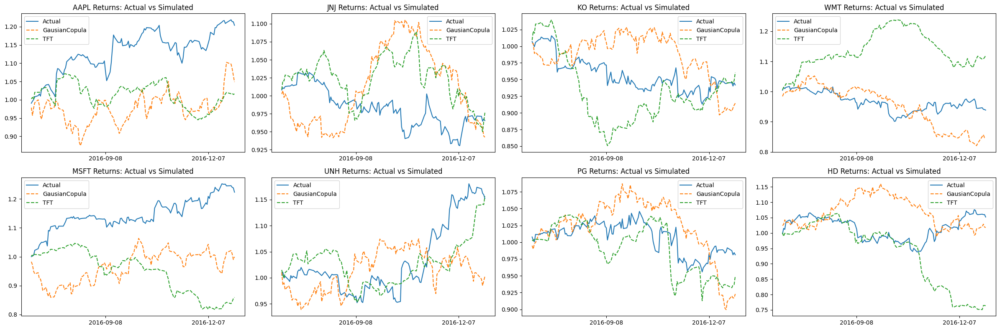

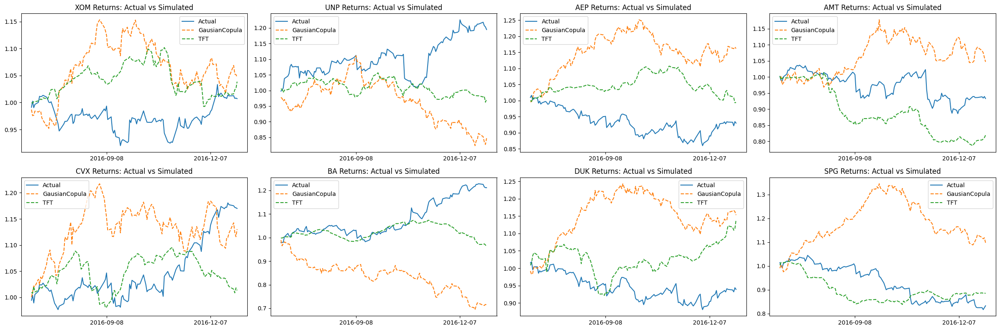

In [27]:
df_validation, df_validation_cum = get_annual_cum_return(start_idx=0, end_idx=6) # 2016
calculate_performance_multi(start_idx=0, end_idx=6, tickers=tickers, year='2016', _df_validation=df_validation)

plt_return = plot_returns(plot_path = plot_path, time_bound = "annual",
                        df_validation=df_validation, df_validation_cum=df_validation_cum
                        )
plt_return.plot_cum_long_returns(year='2016')

7 / 97 2014-01-02 00:00:00 2017-01-01 00:00:00 2017-01-31 00:00:00
8 / 97 2014-02-02 00:00:00 2017-02-01 00:00:00 2017-03-03 00:00:00
9 / 97 2014-03-02 00:00:00 2017-03-01 00:00:00 2017-03-31 00:00:00
10 / 97 2014-04-02 00:00:00 2017-04-01 00:00:00 2017-05-01 00:00:00
11 / 97 2014-05-02 00:00:00 2017-05-01 00:00:00 2017-05-31 00:00:00
12 / 97 2014-06-02 00:00:00 2017-06-01 00:00:00 2017-07-01 00:00:00
13 / 97 2014-07-02 00:00:00 2017-07-01 00:00:00 2017-07-31 00:00:00
14 / 97 2014-08-02 00:00:00 2017-08-01 00:00:00 2017-08-31 00:00:00
15 / 97 2014-09-02 00:00:00 2017-09-01 00:00:00 2017-10-01 00:00:00
16 / 97 2014-10-02 00:00:00 2017-10-01 00:00:00 2017-10-31 00:00:00
17 / 97 2014-11-02 00:00:00 2017-11-01 00:00:00 2017-12-01 00:00:00
18 / 97 2014-12-02 00:00:00 2017-12-01 00:00:00 2017-12-31 00:00:00


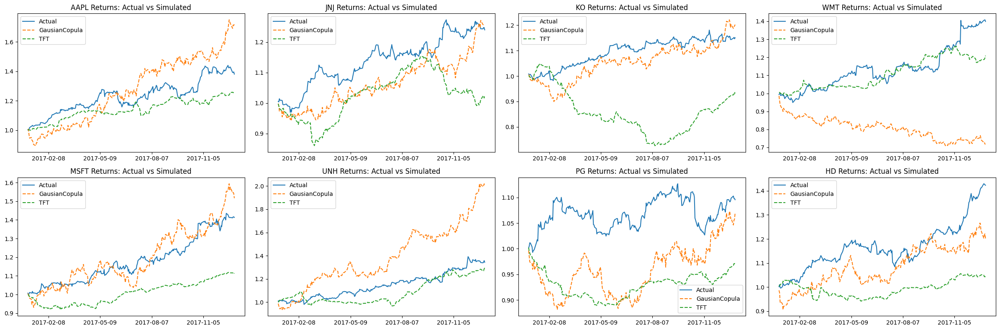

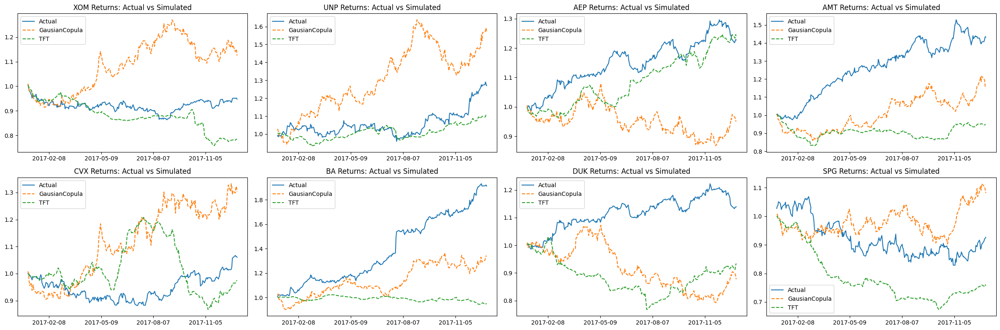

In [28]:
df_validation, df_validation_cum = get_annual_cum_return(start_idx=6, end_idx=18) # 2017
calculate_performance_multi(start_idx=6, end_idx=18, tickers=tickers, year='2017', _df_validation=df_validation)

plt_return = plot_returns(plot_path = plot_path, time_bound = "annual",
                        df_validation=df_validation, df_validation_cum=df_validation_cum
                        )
plt_return.plot_cum_long_returns(year='2017')

19 / 97 2015-01-02 00:00:00 2018-01-01 00:00:00 2018-01-31 00:00:00
20 / 97 2015-02-02 00:00:00 2018-02-01 00:00:00 2018-03-03 00:00:00
21 / 97 2015-03-02 00:00:00 2018-03-01 00:00:00 2018-03-31 00:00:00
22 / 97 2015-04-02 00:00:00 2018-04-01 00:00:00 2018-05-01 00:00:00
23 / 97 2015-05-02 00:00:00 2018-05-01 00:00:00 2018-05-31 00:00:00
24 / 97 2015-06-02 00:00:00 2018-06-01 00:00:00 2018-07-01 00:00:00
25 / 97 2015-07-02 00:00:00 2018-07-01 00:00:00 2018-07-31 00:00:00
26 / 97 2015-08-02 00:00:00 2018-08-01 00:00:00 2018-08-31 00:00:00
27 / 97 2015-09-02 00:00:00 2018-09-01 00:00:00 2018-10-01 00:00:00
28 / 97 2015-10-02 00:00:00 2018-10-01 00:00:00 2018-10-31 00:00:00
29 / 97 2015-11-02 00:00:00 2018-11-01 00:00:00 2018-12-01 00:00:00
30 / 97 2015-12-02 00:00:00 2018-12-01 00:00:00 2018-12-31 00:00:00


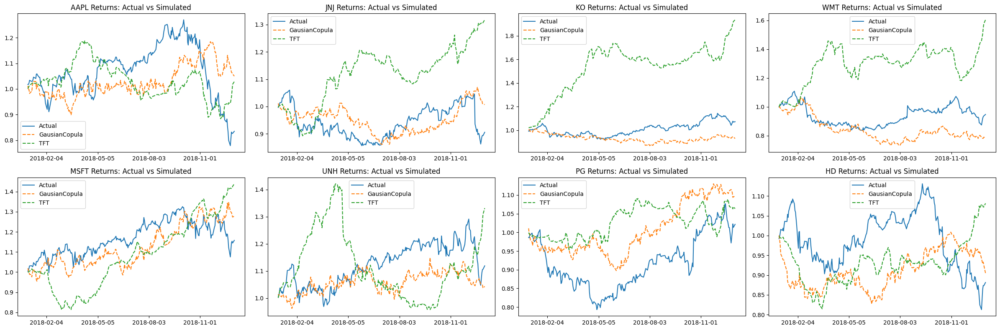

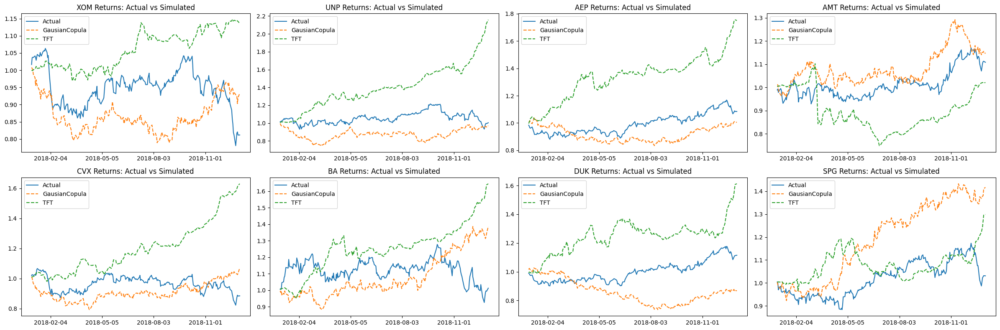

In [29]:
df_validation, df_validation_cum = get_annual_cum_return(start_idx=18, end_idx=30) # 2018
calculate_performance_multi(start_idx=18, end_idx=30, tickers=tickers, year='2018', _df_validation=df_validation)

plt_return = plot_returns(plot_path = plot_path, time_bound = "annual",
                        df_validation=df_validation, df_validation_cum=df_validation_cum
                        )
plt_return.plot_cum_long_returns(year='2018')

31 / 97 2016-01-02 00:00:00 2019-01-01 00:00:00 2019-01-31 00:00:00
32 / 97 2016-02-02 00:00:00 2019-02-01 00:00:00 2019-03-03 00:00:00
33 / 97 2016-03-01 00:00:00 2019-03-01 00:00:00 2019-03-31 00:00:00
34 / 97 2016-04-01 00:00:00 2019-04-01 00:00:00 2019-05-01 00:00:00
35 / 97 2016-05-01 00:00:00 2019-05-01 00:00:00 2019-05-31 00:00:00
36 / 97 2016-06-01 00:00:00 2019-06-01 00:00:00 2019-07-01 00:00:00
37 / 97 2016-07-01 00:00:00 2019-07-01 00:00:00 2019-07-31 00:00:00
38 / 97 2016-08-01 00:00:00 2019-08-01 00:00:00 2019-08-31 00:00:00
39 / 97 2016-09-01 00:00:00 2019-09-01 00:00:00 2019-10-01 00:00:00
40 / 97 2016-10-01 00:00:00 2019-10-01 00:00:00 2019-10-31 00:00:00
41 / 97 2016-11-01 00:00:00 2019-11-01 00:00:00 2019-12-01 00:00:00
42 / 97 2016-12-01 00:00:00 2019-12-01 00:00:00 2019-12-31 00:00:00


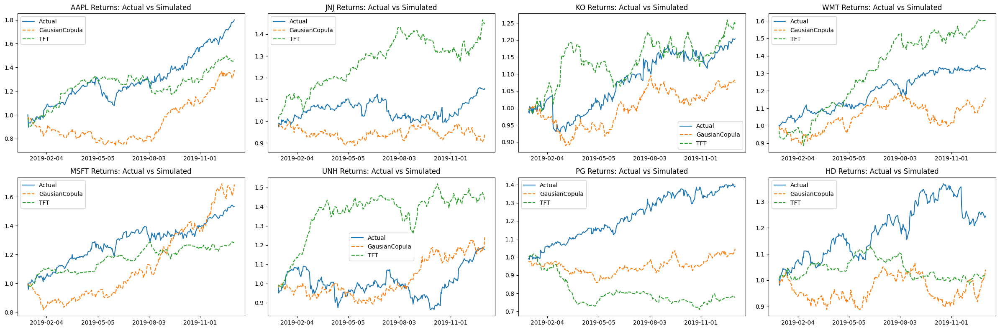

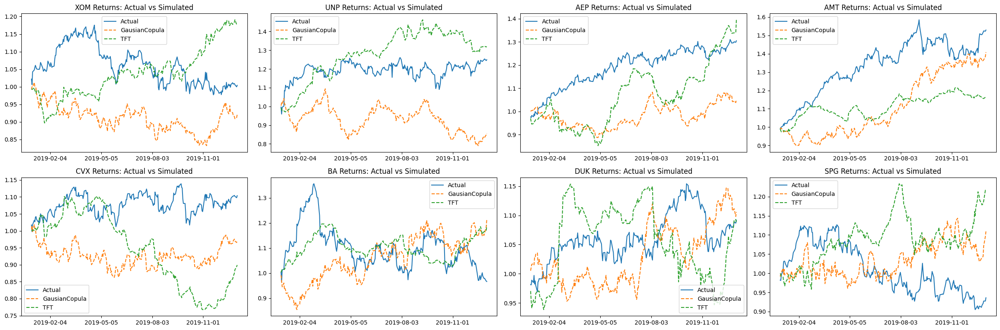

In [30]:
df_validation, df_validation_cum = get_annual_cum_return(start_idx=30, end_idx=42) # 2019
calculate_performance_multi(start_idx=30, end_idx=42, tickers=tickers, year='2019', _df_validation=df_validation)

plt_return = plot_returns(plot_path = plot_path, time_bound = "annual",
                        df_validation=df_validation, df_validation_cum=df_validation_cum
                        )
plt_return.plot_cum_long_returns(year='2019')

43 / 97 2017-01-01 00:00:00 2020-01-01 00:00:00 2020-01-31 00:00:00
44 / 97 2017-02-01 00:00:00 2020-02-01 00:00:00 2020-03-02 00:00:00
45 / 97 2017-03-02 00:00:00 2020-03-01 00:00:00 2020-03-31 00:00:00
46 / 97 2017-04-02 00:00:00 2020-04-01 00:00:00 2020-05-01 00:00:00
47 / 97 2017-05-02 00:00:00 2020-05-01 00:00:00 2020-05-31 00:00:00
48 / 97 2017-06-02 00:00:00 2020-06-01 00:00:00 2020-07-01 00:00:00
49 / 97 2017-07-02 00:00:00 2020-07-01 00:00:00 2020-07-31 00:00:00
50 / 97 2017-08-02 00:00:00 2020-08-01 00:00:00 2020-08-31 00:00:00
51 / 97 2017-09-02 00:00:00 2020-09-01 00:00:00 2020-10-01 00:00:00
52 / 97 2017-10-02 00:00:00 2020-10-01 00:00:00 2020-10-31 00:00:00
53 / 97 2017-11-02 00:00:00 2020-11-01 00:00:00 2020-12-01 00:00:00
54 / 97 2017-12-02 00:00:00 2020-12-01 00:00:00 2020-12-31 00:00:00


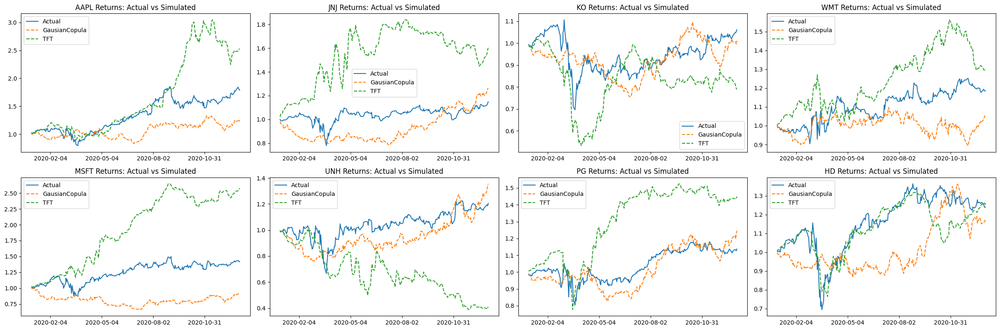

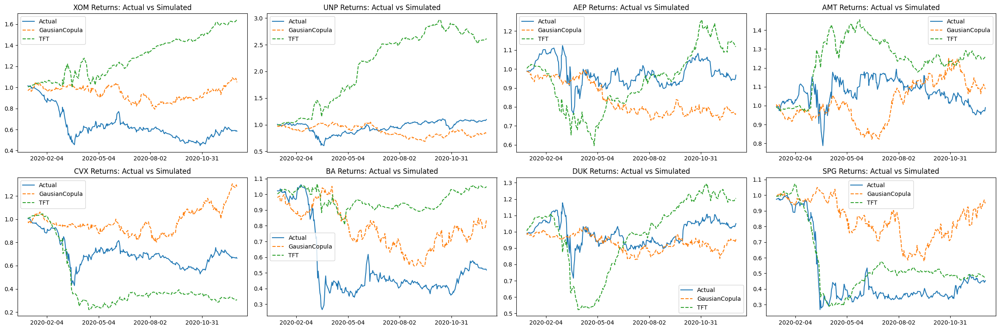

In [31]:
df_validation, df_validation_cum = get_annual_cum_return(start_idx=42, end_idx=54) # 2020
calculate_performance_multi(start_idx=42, end_idx=54, tickers=tickers, year='2020', _df_validation=df_validation)

plt_return = plot_returns(plot_path = plot_path, time_bound = "annual",
                        df_validation=df_validation, df_validation_cum=df_validation_cum
                        )
plt_return.plot_cum_long_returns(year='2020')

55 / 97 2018-01-02 00:00:00 2021-01-01 00:00:00 2021-01-31 00:00:00
56 / 97 2018-02-02 00:00:00 2021-02-01 00:00:00 2021-03-03 00:00:00
57 / 97 2018-03-02 00:00:00 2021-03-01 00:00:00 2021-03-31 00:00:00
58 / 97 2018-04-02 00:00:00 2021-04-01 00:00:00 2021-05-01 00:00:00
59 / 97 2018-05-02 00:00:00 2021-05-01 00:00:00 2021-05-31 00:00:00
60 / 97 2018-06-02 00:00:00 2021-06-01 00:00:00 2021-07-01 00:00:00
61 / 97 2018-07-02 00:00:00 2021-07-01 00:00:00 2021-07-31 00:00:00
62 / 97 2018-08-02 00:00:00 2021-08-01 00:00:00 2021-08-31 00:00:00
63 / 97 2018-09-02 00:00:00 2021-09-01 00:00:00 2021-10-01 00:00:00
64 / 97 2018-10-02 00:00:00 2021-10-01 00:00:00 2021-10-31 00:00:00
65 / 97 2018-11-02 00:00:00 2021-11-01 00:00:00 2021-12-01 00:00:00
66 / 97 2018-12-02 00:00:00 2021-12-01 00:00:00 2021-12-31 00:00:00


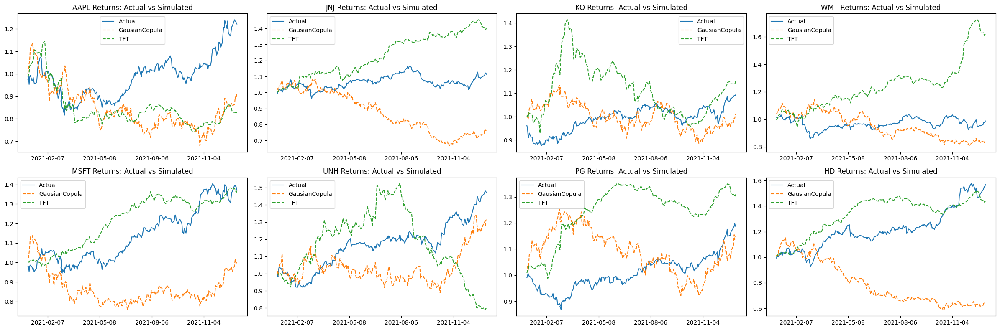

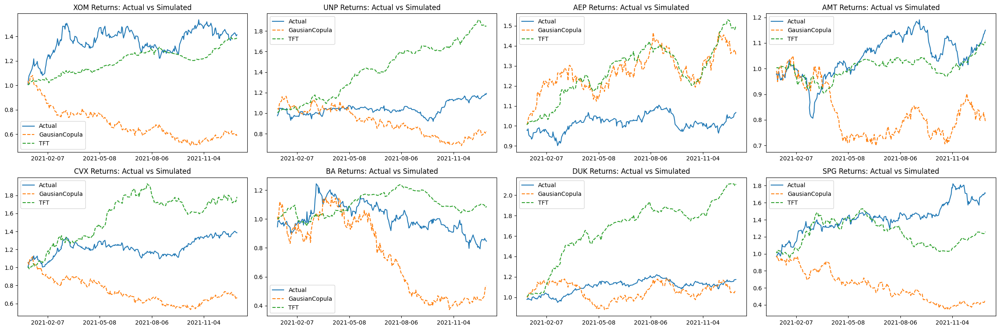

In [32]:
df_validation, df_validation_cum = get_annual_cum_return(start_idx=54, end_idx=66) # 2021
calculate_performance_multi(start_idx=54, end_idx=66, tickers=tickers, year='2021', _df_validation=df_validation)

plt_return = plot_returns(plot_path = plot_path, time_bound = "annual",
                        df_validation=df_validation, df_validation_cum=df_validation_cum
                        )
plt_return.plot_cum_long_returns(year='2021')

67 / 97 2019-01-02 00:00:00 2022-01-01 00:00:00 2022-01-31 00:00:00
68 / 97 2019-02-02 00:00:00 2022-02-01 00:00:00 2022-03-03 00:00:00
69 / 97 2019-03-02 00:00:00 2022-03-01 00:00:00 2022-03-31 00:00:00
70 / 97 2019-04-02 00:00:00 2022-04-01 00:00:00 2022-05-01 00:00:00
71 / 97 2019-05-02 00:00:00 2022-05-01 00:00:00 2022-05-31 00:00:00
72 / 97 2019-06-02 00:00:00 2022-06-01 00:00:00 2022-07-01 00:00:00
73 / 97 2019-07-02 00:00:00 2022-07-01 00:00:00 2022-07-31 00:00:00
74 / 97 2019-08-02 00:00:00 2022-08-01 00:00:00 2022-08-31 00:00:00
75 / 97 2019-09-02 00:00:00 2022-09-01 00:00:00 2022-10-01 00:00:00
76 / 97 2019-10-02 00:00:00 2022-10-01 00:00:00 2022-10-31 00:00:00
77 / 97 2019-11-02 00:00:00 2022-11-01 00:00:00 2022-12-01 00:00:00
78 / 97 2019-12-02 00:00:00 2022-12-01 00:00:00 2022-12-31 00:00:00


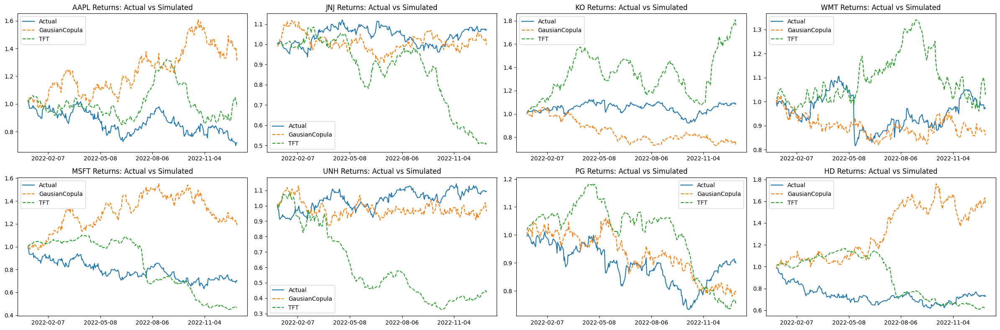

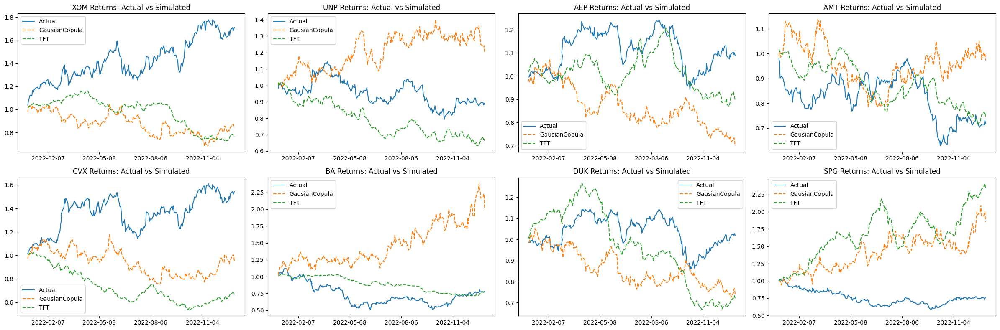

In [33]:
df_validation, df_validation_cum = get_annual_cum_return(start_idx=66, end_idx=78) # 2022
calculate_performance_multi(start_idx=66, end_idx=78, tickers=tickers, year='2022', _df_validation=df_validation)

plt_return = plot_returns(plot_path = plot_path, time_bound = "annual",
                        df_validation=df_validation, df_validation_cum=df_validation_cum
                        )
plt_return.plot_cum_long_returns(year='2022')

79 / 97 2020-01-02 00:00:00 2023-01-01 00:00:00 2023-01-31 00:00:00
80 / 97 2020-02-02 00:00:00 2023-02-01 00:00:00 2023-03-03 00:00:00
81 / 97 2020-03-01 00:00:00 2023-03-01 00:00:00 2023-03-31 00:00:00
82 / 97 2020-04-01 00:00:00 2023-04-01 00:00:00 2023-05-01 00:00:00
83 / 97 2020-05-01 00:00:00 2023-05-01 00:00:00 2023-05-31 00:00:00
84 / 97 2020-06-01 00:00:00 2023-06-01 00:00:00 2023-07-01 00:00:00
85 / 97 2020-07-01 00:00:00 2023-07-01 00:00:00 2023-07-31 00:00:00
86 / 97 2020-08-01 00:00:00 2023-08-01 00:00:00 2023-08-31 00:00:00
87 / 97 2020-09-01 00:00:00 2023-09-01 00:00:00 2023-10-01 00:00:00
88 / 97 2020-10-01 00:00:00 2023-10-01 00:00:00 2023-10-31 00:00:00
89 / 97 2020-11-01 00:00:00 2023-11-01 00:00:00 2023-12-01 00:00:00
90 / 97 2020-12-01 00:00:00 2023-12-01 00:00:00 2023-12-31 00:00:00


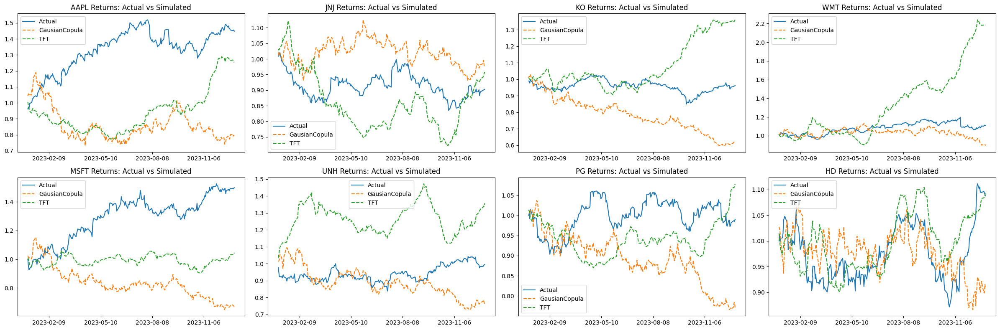

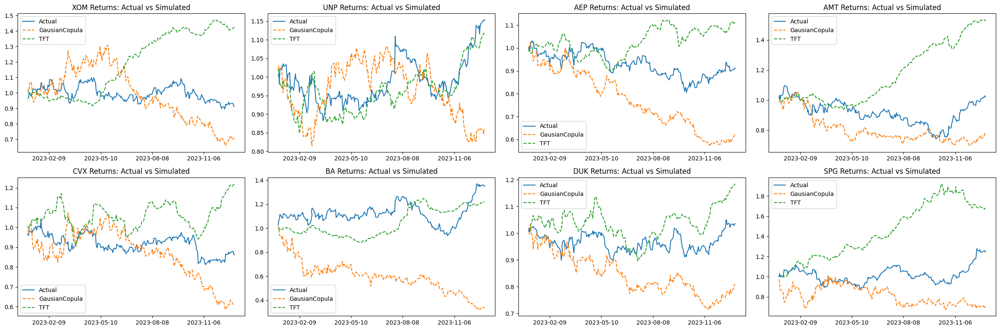

In [34]:
df_validation, df_validation_cum = get_annual_cum_return(start_idx=78, end_idx=90) # 2023
calculate_performance_multi(start_idx=78, end_idx=90, tickers=tickers, year='2023', _df_validation=df_validation)

plt_return = plot_returns(plot_path = plot_path, time_bound = "annual",
                        df_validation=df_validation, df_validation_cum=df_validation_cum
                        )
plt_return.plot_cum_long_returns(year='2023')

91 / 97 2021-01-01 00:00:00 2024-01-01 00:00:00 2024-01-31 00:00:00
92 / 97 2021-02-01 00:00:00 2024-02-01 00:00:00 2024-03-02 00:00:00
93 / 97 2021-03-02 00:00:00 2024-03-01 00:00:00 2024-03-31 00:00:00
94 / 97 2021-04-02 00:00:00 2024-04-01 00:00:00 2024-05-01 00:00:00
95 / 97 2021-05-02 00:00:00 2024-05-01 00:00:00 2024-05-31 00:00:00
96 / 97 2021-06-02 00:00:00 2024-06-01 00:00:00 2024-07-01 00:00:00


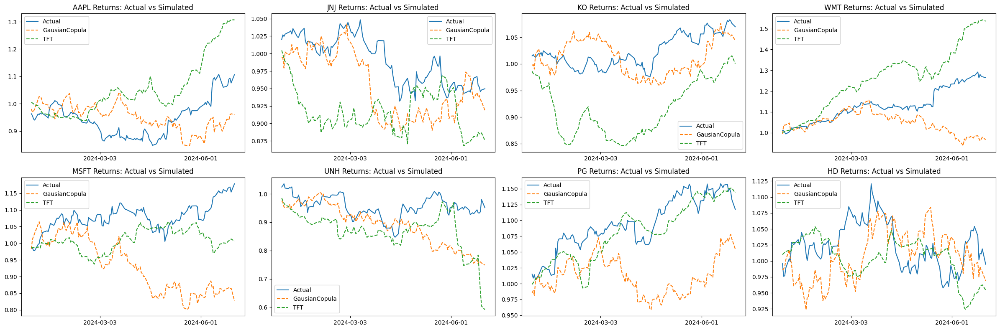

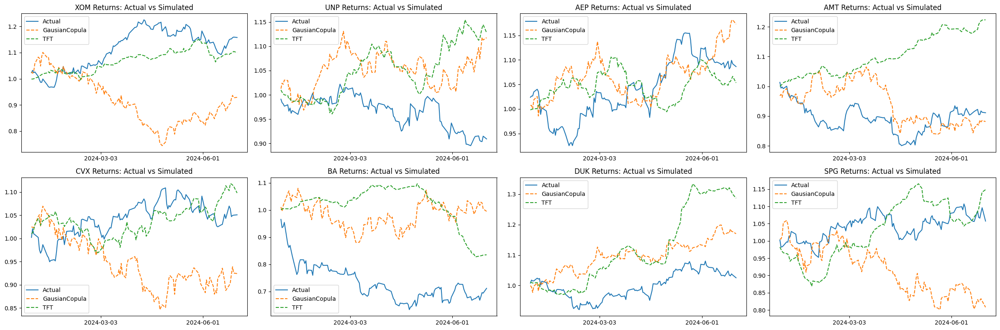

In [35]:
df_validation, df_validation_cum = get_annual_cum_return(start_idx=90, end_idx=96) # 2024
calculate_performance_multi(start_idx=90, end_idx=96, tickers=tickers, year='2024', _df_validation=df_validation)

plt_return = plot_returns(plot_path = plot_path, time_bound = "annual",
                        df_validation=df_validation, df_validation_cum=df_validation_cum
                        )
plt_return.plot_cum_long_returns(year='2024')

1 / 97 2013-07-02 00:00:00 2016-07-01 00:00:00 2016-07-31 00:00:00
2 / 97 2013-08-02 00:00:00 2016-08-01 00:00:00 2016-08-31 00:00:00
3 / 97 2013-09-02 00:00:00 2016-09-01 00:00:00 2016-10-01 00:00:00
4 / 97 2013-10-02 00:00:00 2016-10-01 00:00:00 2016-10-31 00:00:00
5 / 97 2013-11-02 00:00:00 2016-11-01 00:00:00 2016-12-01 00:00:00
6 / 97 2013-12-02 00:00:00 2016-12-01 00:00:00 2016-12-31 00:00:00
7 / 97 2014-01-02 00:00:00 2017-01-01 00:00:00 2017-01-31 00:00:00
8 / 97 2014-02-02 00:00:00 2017-02-01 00:00:00 2017-03-03 00:00:00
9 / 97 2014-03-02 00:00:00 2017-03-01 00:00:00 2017-03-31 00:00:00
10 / 97 2014-04-02 00:00:00 2017-04-01 00:00:00 2017-05-01 00:00:00
11 / 97 2014-05-02 00:00:00 2017-05-01 00:00:00 2017-05-31 00:00:00
12 / 97 2014-06-02 00:00:00 2017-06-01 00:00:00 2017-07-01 00:00:00
13 / 97 2014-07-02 00:00:00 2017-07-01 00:00:00 2017-07-31 00:00:00
14 / 97 2014-08-02 00:00:00 2017-08-01 00:00:00 2017-08-31 00:00:00
15 / 97 2014-09-02 00:00:00 2017-09-01 00:00:00 2017-10-0

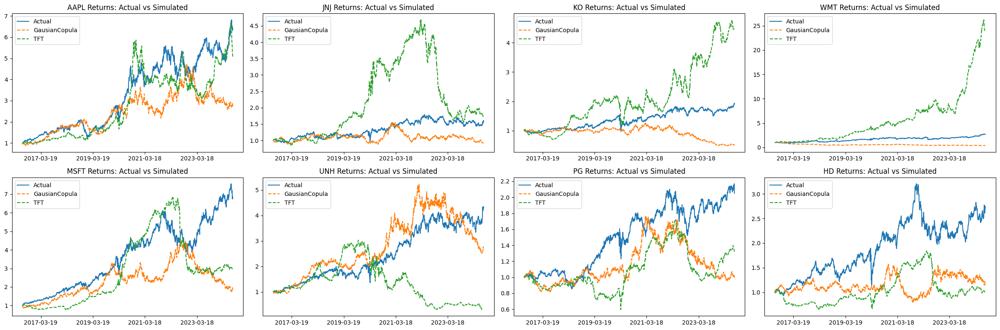

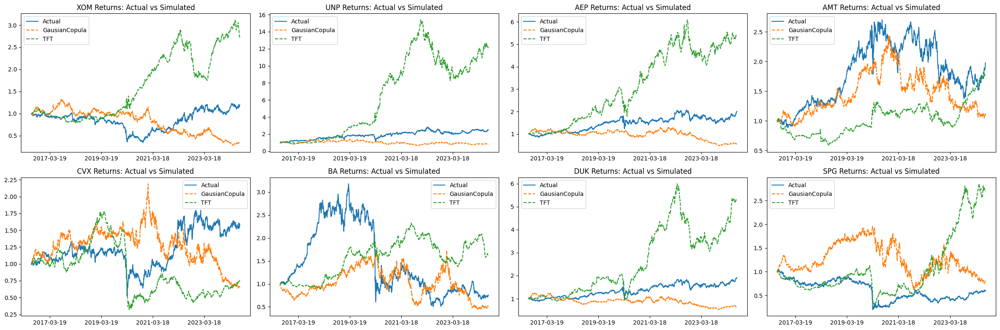

In [36]:
df_validation, df_validation_cum = get_annual_cum_return(start_idx=0, end_idx=len(time_bounds)) # all
plt_return = plot_returns(plot_path = plot_path, time_bound = time_bounds.iloc[96]['predict_start'].strftime("%Y-%m-%d"),
                        df_validation=df_validation, df_validation_cum=df_validation_cum
                        )
plt_return.plot_cum_longlong_returns(year='all-period')